<a href="https://colab.research.google.com/github/robyng15/Boolean-Models/blob/master/Yeast_Cell_7_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [40]:
file = open('yeast-cell.txt')
lines = file.readlines()

def list_gene_with_rule(locallines):
  length = len(locallines)
  keywds = ['or','and','not']
  gene_with_rule = []
  for i in range(length - 1):
    #print(lines[i+1])
    l = lines[i+1].strip('\n')
    gene_with_rule.append(l.split('\t'))
  return gene_with_rule
print(list_gene_with_rule(lines))

proteins = [item[0] for item in list_gene_with_rule(lines)]
rules = [item[1] for item in list_gene_with_rule(lines)]
#print(proteins)
#print(rules)

[['Cln3', '( )'], ['MBF', '( Cln3 not Clb1 )'], ['SBF', '( Cln3 not Clb1 )'], ['Cln1', '( SBF )'], ['Cdh1', '( Cdc20 not Cln1 or Clb5 or Clb1 )'], ['Swi5', '( Mcm1 or Cdc20 not Clb1 )'], ['Cdc20', '( Mcm1 or Clb1 )'], ['Clb5', '( MBF not Sic1 or Cdc20 )'], ['Sic1', '( Swi5 or Cdc20 not Cln1 or Clb5 or Clb1 )'], ['Clb1', '( Mcm1 or Clb5 not Cdc20 or Cdh1 or Sic1 )'], ['Mcm1', '( Clb5 or Clb1 )']]


In [41]:
# Function to return formula depending on protein_id
def get_formula(protein_id, lines):
  for rule in list_gene_with_rule(list(lines)):
    if protein_id == rule[0]:
      return(rule[1])
print(get_formula('Mcm1', list(lines)))

( Clb5 or Clb1 )


In [42]:
# Find activators and inhibitors
def find_activ_inhib(formula):
  #print(formula) 
  tokens = []
  inhibitors = []
  activators = []
  if formula == '( )':    
    return [activators, inhibitors]
  else:
    token = formula.split(' ')
    for i in token:
      if i != '(' and i != ')' and i != 'not' and i != 'or':
        tokens.append(i) 
    for i in range(len(tokens)):
      if 'not' in token:
        if token.index(tokens[i]) < token.index('not'):
          activators.append(tokens[i])
        if token.index(tokens[i]) > token.index('not'):
          inhibitors.append(tokens[i])
      if 'not' not in token:
        activators.append(tokens[i])
  return [activators, inhibitors]
      
print(find_activ_inhib(get_formula('Mcm1', list(lines))))

[['Clb5', 'Clb1'], []]


In [43]:
# Inhibition and activation arrows are switched (29)
def perturb_edge_reverse(proteins, activ_inhib):
  reverse_formula = []
  # Perturbs edge reverse for activators one at a time
  for k in range(len(rules)):
    activators = find_activ_inhib(rules[k])[0]
    inhibitors = find_activ_inhib(rules[k])[1]
    #print([activators, inhibitors])
    new_activ = []
    new_inhib = []
    perturb_activ = activators.copy()
    perturb_inhib = inhibitors.copy()
    for i in range(len(activators)):
      #print(activators[i])
      if len(activators) != 0:
        perturb_inhib.append(activators[i])
        perturb_activ.remove(activators[i])
        reverse_formula.append([proteins[k], [perturb_activ, perturb_inhib]])
        perturb_activ = activators
        perturb_inhib = inhibitors
   
  # Perturbs edge reverse for inhibitors one at a time
  for k in range(len(rules)):
    activators = find_activ_inhib(rules[k])[0]
    inhibitors = find_activ_inhib(rules[k])[1]
  #print([activators, inhibitors])
    new_activ = []
    new_inhib = []
    perturb_activ = activators.copy()
    perturb_inhib = inhibitors.copy()
    for j in range(len(list(inhibitors))):
      #print(inhibitors)
      if len(inhibitors) != 0:
        perturb_activ.append(inhibitors[j])
        perturb_inhib.remove(inhibitors[j])
        reverse_formula.append([proteins[k], [perturb_activ, perturb_inhib]])
        perturb_activ = list(activators)
        perturb_inhib = list(inhibitors)
  return reverse_formula

f = list()
for r in range(len(rules)):
  f.append(find_activ_inhib(rules[r]))
#print(f)

print(perturb_edge_reverse(proteins, f))
#print(len(perturb_edge_reverse(proteins, f)))

[['MBF', [[], ['Clb1', 'Cln3']]], ['SBF', [[], ['Clb1', 'Cln3']]], ['Cln1', [[], ['SBF']]], ['Cdh1', [[], ['Cln1', 'Clb5', 'Clb1', 'Cdc20']]], ['Swi5', [['Cdc20'], ['Clb1', 'Mcm1']]], ['Swi5', [['Mcm1'], ['Clb1', 'Cdc20']]], ['Cdc20', [['Clb1'], ['Mcm1']]], ['Cdc20', [['Mcm1'], ['Clb1']]], ['Clb5', [[], ['Sic1', 'Cdc20', 'MBF']]], ['Sic1', [['Cdc20'], ['Cln1', 'Clb5', 'Clb1', 'Swi5']]], ['Sic1', [['Swi5'], ['Cln1', 'Clb5', 'Clb1', 'Cdc20']]], ['Clb1', [['Clb5'], ['Cdc20', 'Cdh1', 'Sic1', 'Mcm1']]], ['Clb1', [['Mcm1'], ['Cdc20', 'Cdh1', 'Sic1', 'Clb5']]], ['Mcm1', [['Clb1'], ['Clb5']]], ['Mcm1', [['Clb5'], ['Clb1']]], ['MBF', [['Cln3', 'Clb1'], []]], ['SBF', [['Cln3', 'Clb1'], []]], ['Cdh1', [['Cdc20', 'Cln1'], ['Clb5', 'Clb1']]], ['Cdh1', [['Cdc20', 'Clb5'], ['Cln1', 'Clb1']]], ['Cdh1', [['Cdc20', 'Clb1'], ['Cln1', 'Clb5']]], ['Swi5', [['Mcm1', 'Cdc20', 'Clb1'], []]], ['Clb5', [['MBF', 'Sic1'], ['Cdc20']]], ['Clb5', [['MBF', 'Cdc20'], ['Sic1']]], ['Sic1', [['Swi5', 'Cdc20', 'Cln1'], ['

In [44]:
import numpy as np
# Perturbation by adding an edge to activator/inhibitor list one at a time (174)
def perturb_edge_add(proteins, activ_inhib):
  added_formula = []
  # Goes through activators, adds one at a time
  for i in range(len(rules)):
    activators = find_activ_inhib(rules[i])[0]
    inhibitors = find_activ_inhib(rules[i])[1]
    #print([activators, inhibitors])
    perturb_activ = activators.copy()
    for k in range(len(proteins)):
      if proteins[k] not in activators and proteins[k] not in inhibitors and proteins[k] != proteins[i]:
        perturb_activ.append(proteins[k])
        #print(perturb_activ)
        added_formula.append([proteins[i], [perturb_activ, inhibitors]])
        #print(added_formula)
        perturb_activ = list(activators)
      else:
        pass
  # Goes through list of inhibitors, adds one at a time      
  for i in range(len(rules)):
    activators = find_activ_inhib(rules[i])[0]
    inhibitors = find_activ_inhib(rules[i])[1]        
    perturb_inhib = inhibitors.copy()
    for k in range(len(proteins)):
      if proteins[k] not in inhibitors and proteins[k] not in activators and proteins[k] != proteins[i]:
        perturb_inhib.append(proteins[k])
        #print(perturb_inhib)
        added_formula.append([proteins[i], [activators, perturb_inhib]])
        #print(added_formula)
        perturb_inhib = list(inhibitors)
      else:
        pass 
  return added_formula
  
f = list()
for r in range(len(rules)):
  f.append(find_activ_inhib(rules[r]))
#print(f)
  
print(perturb_edge_add(proteins, f))
print(len(perturb_edge_add(proteins, f)))
#print(np.array(perturb_edge_add(proteins, f)))

[['Cln3', [['MBF'], []]], ['Cln3', [['SBF'], []]], ['Cln3', [['Cln1'], []]], ['Cln3', [['Cdh1'], []]], ['Cln3', [['Swi5'], []]], ['Cln3', [['Cdc20'], []]], ['Cln3', [['Clb5'], []]], ['Cln3', [['Sic1'], []]], ['Cln3', [['Clb1'], []]], ['Cln3', [['Mcm1'], []]], ['MBF', [['Cln3', 'SBF'], ['Clb1']]], ['MBF', [['Cln3', 'Cln1'], ['Clb1']]], ['MBF', [['Cln3', 'Cdh1'], ['Clb1']]], ['MBF', [['Cln3', 'Swi5'], ['Clb1']]], ['MBF', [['Cln3', 'Cdc20'], ['Clb1']]], ['MBF', [['Cln3', 'Clb5'], ['Clb1']]], ['MBF', [['Cln3', 'Sic1'], ['Clb1']]], ['MBF', [['Cln3', 'Mcm1'], ['Clb1']]], ['SBF', [['Cln3', 'MBF'], ['Clb1']]], ['SBF', [['Cln3', 'Cln1'], ['Clb1']]], ['SBF', [['Cln3', 'Cdh1'], ['Clb1']]], ['SBF', [['Cln3', 'Swi5'], ['Clb1']]], ['SBF', [['Cln3', 'Cdc20'], ['Clb1']]], ['SBF', [['Cln3', 'Clb5'], ['Clb1']]], ['SBF', [['Cln3', 'Sic1'], ['Clb1']]], ['SBF', [['Cln3', 'Mcm1'], ['Clb1']]], ['Cln1', [['SBF', 'Cln3'], []]], ['Cln1', [['SBF', 'MBF'], []]], ['Cln1', [['SBF', 'Cdh1'], []]], ['Cln1', [['SBF', 

In [126]:
import numpy as np
# Perturbation by removing an edge from activator/inhibitor list (34)
def perturb_edge_delete(proteins, activ_inhib):
  deleted_formula = []
  # Goes through list of activators, deletes one at a time
  for i in range(len(rules)):
    activators = find_activ_inhib(rules[i])[0]
    inhibitors = find_activ_inhib(rules[i])[1]
    #print([activators, inhibitors])
    perturb_activ = activators.copy()
    for k in range(len(proteins)):
      if proteins[k] in activators:
        perturb_activ.remove(proteins[k])
        deleted_formula.append([proteins[i], [perturb_activ, inhibitors]])
        #print(deleted_formula)
        perturb_activ = list(activators)
      else:
        pass
  # Goes through list of inhibitors, deletes one at a time        
  for i in range(len(rules)):
    activators = find_activ_inhib(rules[i])[0]
    inhibitors = find_activ_inhib(rules[i])[1]
    perturb_inhib = inhibitors.copy()
    for k in range(len(proteins)):
      if proteins[k] in inhibitors:
        perturb_inhib.remove(proteins[k])
        deleted_formula.append([proteins[i], [activators, perturb_inhib]])
        perturb_inhib = list(inhibitors)
      else:    
        pass   
  return deleted_formula
  
print(perturb_edge_delete(proteins, f))
print(len(perturb_edge_delete(proteins, f)))
#print(np.array(perturb_edge_delete(proteins, f)))

[['MBF', [[], ['Clb1']]], ['SBF', [[], ['Clb1']]], ['Cln1', [[], []]], ['Cdh1', [[], ['Cln1', 'Clb5', 'Clb1']]], ['Swi5', [['Mcm1'], ['Clb1']]], ['Swi5', [['Cdc20'], ['Clb1']]], ['Cdc20', [['Mcm1'], []]], ['Cdc20', [['Clb1'], []]], ['Clb5', [[], ['Sic1', 'Cdc20']]], ['Sic1', [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']]], ['Sic1', [['Swi5'], ['Cln1', 'Clb5', 'Clb1']]], ['Clb1', [['Mcm1'], ['Cdc20', 'Cdh1', 'Sic1']]], ['Clb1', [['Clb5'], ['Cdc20', 'Cdh1', 'Sic1']]], ['Mcm1', [['Clb1'], []]], ['Mcm1', [['Clb5'], []]], ['MBF', [['Cln3'], []]], ['SBF', [['Cln3'], []]], ['Cdh1', [['Cdc20'], ['Clb5', 'Clb1']]], ['Cdh1', [['Cdc20'], ['Cln1', 'Clb1']]], ['Cdh1', [['Cdc20'], ['Cln1', 'Clb5']]], ['Swi5', [['Mcm1', 'Cdc20'], []]], ['Clb5', [['MBF'], ['Sic1']]], ['Clb5', [['MBF'], ['Cdc20']]], ['Sic1', [['Swi5', 'Cdc20'], ['Clb5', 'Clb1']]], ['Sic1', [['Swi5', 'Cdc20'], ['Cln1', 'Clb1']]], ['Sic1', [['Swi5', 'Cdc20'], ['Cln1', 'Clb5']]], ['Clb1', [['Mcm1', 'Clb5'], ['Cdc20', 'Sic1']]], ['Clb1', [['Mcm1', 

In [46]:
# Delete each protein at a time, set it to 0 (remove from activ and inhib)
def perturb_node_delete(proteins, activ_inhib):
  proteins_copy = proteins.copy()
  perturb_nodes = []
  #print(activ_inhib)
  
  for i in range(len(proteins)):
    #print(proteins[i])
    proteins_copy.remove(proteins[i])
    #print(proteins_copy)
    for j in range(len(activ_inhib)):
      activators = activ_inhib[j][0]
      inhibitors = activ_inhib[j][1]
      perturb_activ = activators.copy()
      perturb_inhib = inhibitors.copy()
      #print([activators, inhibitors])
      if proteins[i] in activators:
        perturb_activ.remove(proteins[i])
       #print(activators)
      if proteins[i] in inhibitors:
        perturb_inhib.remove(proteins[i])
          #print(inhibitors)
      #print([activators, inhibitors])
      perturb_nodes.append([proteins[i], [perturb_activ, perturb_inhib]])
      proteins_copy = list(proteins)
      perturb_activ = list(activators)
      perturb_inhib = list(inhibitors)
    
  return perturb_nodes
    
print(perturb_node_delete(proteins, f))
#print(len(perturb_node_delete(proteins, f)))
#print(np.array(perturb_node_delete(proteins, f)))

[['Cln3', [[], []]], ['Cln3', [[], ['Clb1']]], ['Cln3', [[], ['Clb1']]], ['Cln3', [['SBF'], []]], ['Cln3', [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']]], ['Cln3', [['Mcm1', 'Cdc20'], ['Clb1']]], ['Cln3', [['Mcm1', 'Clb1'], []]], ['Cln3', [['MBF'], ['Sic1', 'Cdc20']]], ['Cln3', [['Swi5', 'Cdc20'], ['Cln1', 'Clb5', 'Clb1']]], ['Cln3', [['Mcm1', 'Clb5'], ['Cdc20', 'Cdh1', 'Sic1']]], ['Cln3', [['Clb5', 'Clb1'], []]], ['MBF', [[], []]], ['MBF', [['Cln3'], ['Clb1']]], ['MBF', [['Cln3'], ['Clb1']]], ['MBF', [['SBF'], []]], ['MBF', [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']]], ['MBF', [['Mcm1', 'Cdc20'], ['Clb1']]], ['MBF', [['Mcm1', 'Clb1'], []]], ['MBF', [[], ['Sic1', 'Cdc20']]], ['MBF', [['Swi5', 'Cdc20'], ['Cln1', 'Clb5', 'Clb1']]], ['MBF', [['Mcm1', 'Clb5'], ['Cdc20', 'Cdh1', 'Sic1']]], ['MBF', [['Clb5', 'Clb1'], []]], ['SBF', [[], []]], ['SBF', [['Cln3'], ['Clb1']]], ['SBF', [['Cln3'], ['Clb1']]], ['SBF', [[], []]], ['SBF', [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']]], ['SBF', [['Mcm1', 'Cdc20'], ['Clb1']]

In [61]:
def perturb_node_delete_zero(proteins):
  node_delete = []
  proteins_copy = proteins.copy()
  for i in range(len(proteins)):
    proteins_copy[proteins.index(proteins[i])] = 0
    node_delete.append([proteins[i], proteins_copy])
    proteins_copy = list(proteins)
  return node_delete

print(perturb_node_delete_zero(proteins))  
print(len(perturb_node_delete_zero(proteins)))

[['Cln3', [0, 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['MBF', ['Cln3', 0, 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['SBF', ['Cln3', 'MBF', 0, 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Cln1', ['Cln3', 'MBF', 'SBF', 0, 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Cdh1', ['Cln3', 'MBF', 'SBF', 'Cln1', 0, 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Swi5', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 0, 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Cdc20', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 0, 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Clb5', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 0, 'Sic1', 'Clb1', 'Mcm1']], ['Sic1', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 0, 'Clb1', 'Mcm1']], ['Clb1', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 0, 'Mcm1']], ['Mcm1', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cd

In [57]:
def perturb_node_overexpress(proteins):
  node_overexpress = []
  proteins_copy = proteins.copy()
  for i in range(len(proteins)):
    proteins_copy[proteins.index(proteins[i])] = 1
    node_overexpress.append([proteins[i], proteins_copy])
    proteins_copy = list(proteins)
  return node_overexpress
  
print(perturb_node_overexpress(proteins))
print(len(perturb_node_overexpress(proteins)))

[['Cln3', [1, 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['MBF', ['Cln3', 1, 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['SBF', ['Cln3', 'MBF', 1, 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Cln1', ['Cln3', 'MBF', 'SBF', 1, 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Cdh1', ['Cln3', 'MBF', 'SBF', 'Cln1', 1, 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Swi5', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 1, 'Cdc20', 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Cdc20', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 1, 'Clb5', 'Sic1', 'Clb1', 'Mcm1']], ['Clb5', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 1, 'Sic1', 'Clb1', 'Mcm1']], ['Sic1', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 1, 'Clb1', 'Mcm1']], ['Clb1', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cdc20', 'Clb5', 'Sic1', 1, 'Mcm1']], ['Mcm1', ['Cln3', 'MBF', 'SBF', 'Cln1', 'Cdh1', 'Swi5', 'Cd

In [10]:
# Compute protein state for original model
def compute_protein_state(prot, net_state):
  for i in range(len(list_gene_with_rule(lines))):
    regs = [i[0] for i in list_gene_with_rule(lines)]
    if regs[i] == prot:
      formula = get_formula(list_gene_with_rule(lines)[i][0], list(lines))
      #print(find_activ_inhib(formula)[0])
      activators = find_activ_inhib(formula)[0]
      inhibitors = find_activ_inhib(formula)[1]
      break
#   print(formula)  
#   print(activators)
#   print(inhibitors)

  # Sets activators to 1 if on, and inhibitors to -1 if on
  for i in activators:
    if len(i) != 0:
      if net_state[proteins.index(i)] == 1:
        activators[activators.index(i)] = 1
      else:
        activators[activators.index(i)] = 0
    else:
      activators[activators.index(i)] = 0
  for i in inhibitors:
    if len(i) != 0:
      if net_state[proteins.index(i)] == 1:
        inhibitors[inhibitors.index(i)] = -1
      else:
        inhibitors[inhibitors.index(i)] = 0
    else:
      inhibitors[inhibitors.index(i)] = 0
  #print(inhibitors)

  # Finds sum of activators list and inhibitors list
  if len(activators) == 0:
    sum_activators = 0
  else:
    sum_activators = sum(activators)
  #print(sum_activators)
  if len(inhibitors) == 0:
    sum_inhibitors = 0
  else:
    sum_inhibitors = sum(inhibitors)
  #print(sum_inhibitors)

  # Find sum of activators list with inhibitors list to assign value for state
  final_count = sum_activators + sum_inhibitors
  #print(final_count)
  if final_count == 0 and (len(inhibitors) == 0 or prot == 'Swi5'):
    return 0
  if final_count > 0:
    return 1
  if final_count < 0:
    return 0
  if final_count == 0:
    index = regs.index(prot)
    #print(index)
    return net_state[index]
      
print(compute_protein_state('Clb5', [0,1,0,0,0,0,0,1,1,0,0]))

1


In [11]:
import numpy as np
# Find new rule for add edge
def find_new_rule_add(prot, new_activ_inhib):
  f = list()
  new_list = []
  for r in range(len(rules)):
    f.append(find_activ_inhib(rules[r]))
  perturbed_activ_inhib = perturb_edge_add(proteins, f)
  #print(perturbed_activ_inhib)
  for i in range(len(proteins)):
    for j in range(len(perturbed_activ_inhib)):
      if prot in perturbed_activ_inhib[j][0]:
        new_list.append(perturbed_activ_inhib[j][1])
    return new_list
  
print(find_new_rule_add('Cln3', perturb_edge_add(proteins, f)))
#print(len(find_new_rule_add('Cln3', perturb_edge_add(proteins, f))))
#print(np.array(find_new_rule_add('Mcm1', perturb_edge_add(proteins, f))))

[[['MBF'], []], [['SBF'], []], [['Cln1'], []], [['Cdh1'], []], [['Swi5'], []], [['Cdc20'], []], [['Clb5'], []], [['Sic1'], []], [['Clb1'], []], [['Mcm1'], []], [[], ['MBF']], [[], ['SBF']], [[], ['Cln1']], [[], ['Cdh1']], [[], ['Swi5']], [[], ['Cdc20']], [[], ['Clb5']], [[], ['Sic1']], [[], ['Clb1']], [[], ['Mcm1']]]


In [127]:
import numpy as np
# Find new rule for add edge
def find_new_rule_delete(proteins, new_activ_inhib): #changed prot to proteins
  f = list()
  new_list = []
  for r in range(len(rules)):
    f.append(find_activ_inhib(rules[r]))
  perturbed_activ_inhib = perturb_edge_delete(proteins, f)
  #print(perturbed_activ_inhib)
  for i in range(len(proteins)):
    for j in range(len(perturbed_activ_inhib)):
      if proteins[i] in perturbed_activ_inhib[j][0]:  #changed prot to proteins[i]
        new_list.append([proteins[i], perturbed_activ_inhib[j][1]])
  return new_list
  
print(find_new_rule_delete(proteins, perturb_edge_delete(proteins, f)))   #changed 'Cln3' to proteins
#print(len(find_new_rule_delete('Cln3', perturb_edge_delete(proteins, f))))
#print(np.array(find_new_rule_delete('Mcm1', perturb_edge_delete(proteins, f))))

[['MBF', [[], ['Clb1']]], ['MBF', [['Cln3'], []]], ['SBF', [[], ['Clb1']]], ['SBF', [['Cln3'], []]], ['Cln1', [[], []]], ['Cdh1', [[], ['Cln1', 'Clb5', 'Clb1']]], ['Cdh1', [['Cdc20'], ['Clb5', 'Clb1']]], ['Cdh1', [['Cdc20'], ['Cln1', 'Clb1']]], ['Cdh1', [['Cdc20'], ['Cln1', 'Clb5']]], ['Swi5', [['Mcm1'], ['Clb1']]], ['Swi5', [['Cdc20'], ['Clb1']]], ['Swi5', [['Mcm1', 'Cdc20'], []]], ['Cdc20', [['Mcm1'], []]], ['Cdc20', [['Clb1'], []]], ['Clb5', [[], ['Sic1', 'Cdc20']]], ['Clb5', [['MBF'], ['Sic1']]], ['Clb5', [['MBF'], ['Cdc20']]], ['Sic1', [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']]], ['Sic1', [['Swi5'], ['Cln1', 'Clb5', 'Clb1']]], ['Sic1', [['Swi5', 'Cdc20'], ['Clb5', 'Clb1']]], ['Sic1', [['Swi5', 'Cdc20'], ['Cln1', 'Clb1']]], ['Sic1', [['Swi5', 'Cdc20'], ['Cln1', 'Clb5']]], ['Clb1', [['Mcm1'], ['Cdc20', 'Cdh1', 'Sic1']]], ['Clb1', [['Clb5'], ['Cdc20', 'Cdh1', 'Sic1']]], ['Clb1', [['Mcm1', 'Clb5'], ['Cdc20', 'Sic1']]], ['Clb1', [['Mcm1', 'Clb5'], ['Cdh1', 'Sic1']]], ['Clb1', [['Mcm1', 'Clb

In [182]:
import numpy as np
def perturb_rules_delete(perturbed_rule, activ_inhib):
  perturbed_rules = perturb_edge_delete(proteins, f)
  #perturbed_rules = perturb_edge_add(proteins, f)
  activ_inhib_copy = activ_inhib.copy()
  #print(activ_inhib_copy)
  perturb_rules_delete = []
  
  for i in range(len(perturbed_rules)):
    #print(perturbed_rules[i])
    #print(perturbed_rules[i][0])
    index = proteins.index(perturbed_rules[i][0])
    #print(index)
    #print(activ_inhib_copy[index])
    activ_inhib_copy[index] = perturbed_rules[i][1]
    #print(activ_inhib_copy)
    perturb_rules_delete.append([perturbed_rules[i][0], activ_inhib_copy])
    activ_inhib_copy = list(activ_inhib)
    #print(activ_inhib_copy)
  return perturb_rules_delete

print(perturb_rules_delete(perturb_edge_delete(proteins, f), f))
#print(np.array(perturb_rules_delete(perturb_edge_delete(proteins, f), f, [0,0,0,0,0,0,0,0,0,0,0])))

[['MBF', [[[], []], [[], ['Clb1']], [['Cln3'], ['Clb1']], [['SBF'], []], [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Cdc20'], ['Clb1']], [['Mcm1', 'Clb1'], []], [['MBF'], ['Sic1', 'Cdc20']], [['Swi5', 'Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Clb5'], ['Cdc20', 'Cdh1', 'Sic1']], [['Clb5', 'Clb1'], []]]], ['SBF', [[[], []], [['Cln3'], ['Clb1']], [[], ['Clb1']], [['SBF'], []], [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Cdc20'], ['Clb1']], [['Mcm1', 'Clb1'], []], [['MBF'], ['Sic1', 'Cdc20']], [['Swi5', 'Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Clb5'], ['Cdc20', 'Cdh1', 'Sic1']], [['Clb5', 'Clb1'], []]]], ['Cln1', [[[], []], [['Cln3'], ['Clb1']], [['Cln3'], ['Clb1']], [[], []], [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Cdc20'], ['Clb1']], [['Mcm1', 'Clb1'], []], [['MBF'], ['Sic1', 'Cdc20']], [['Swi5', 'Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Clb5'], ['Cdc20', 'Cdh1', 'Sic1']], [['Clb5', 'Clb1'], []]]], ['Cdh1', [[[], []], [['Cln3'], ['Clb1']], [['Cln3

In [194]:
def compute_protein_state_perturb(prot, perturbed_rules, activ_inhib, net_state):
  #print(perturbed_rules)
  #print(activ_inhib)
  activ_inhib_copy = list(activ_inhib)
  regs = [i[0] for i in list_gene_with_rule(lines)]

  # Delete edges
  for i in range(len(perturbed_rules)):
    for j in range(len(proteins)):
      activators = perturbed_rules[i][1][j][0]
      inhibitors = perturbed_rules[i][1][j][1]
      print([activators, inhibitors])

#   # Sets activators to 1 if on, and inhibitors to -1 if on
      for i in activators:
        if len(activators) != 0:
          if net_state[proteins.index(i)] == 1:
            activators[activators.index(i)] = 1
          else:
            activators[activators.index(i)] = 0
        else:
          activators[activators.index(i)] = 0
      for i in inhibitors:
        if len(inhibitors) != 0:
          if net_state[proteins.index(i)] == 1:
            inhibitors[inhibitors.index(i)] = -1
          else:
            inhibitors[inhibitors.index(i)] = 0
        else:
          inhibitors[inhibitors.index(i)] = 0
      #print(inhibitors)

      # Finds sum of activators list and inhibitors list
      if len(activators) == 0:
        sum_activators = 0
      else:
        sum_activators = sum(activators)
      #print(sum_activators)
      if len(inhibitors) == 0:
        sum_inhibitors = 0
      else:
        sum_inhibitors = sum(inhibitors)

      #print([sum_activators, sum_inhibitors])
      activ_inhib_copy = list(activ_inhib)

      #Find sum of activators list with inhibitors list to assign value for state
      final_count = sum_activators + sum_inhibitors
      print(final_count)
      if final_count == 0 and (len(inhibitors) == 0 or prot == 'Swi5'):
        return 0
      if final_count > 0:
        return 1
      if final_count < 0:
        return 0
      if final_count == 0:
        index = regs.index(prot)
        return net_state[index]

    if len(perturbed_rule) == 0:
      activators = []
      inhibitors = []
      sum_activators = 0
      sum_inhibitors = 0 
      final_count = sum_activators + sum_inhibitors
      if final_count == 0 and len(inhibitors) == 0:
        return 0

#print(compute_protein_state_perturb('Cln3', find_new_rule_add('Cln3', perturb_edge_add(proteins, f)), f, [0,0,0,0,0,0,0,1,0,1,0]))#perturbed_rule, f, [0,0,0,0,0,0,0,0,0,0,0]))
print(compute_protein_state_perturb('Cln3', perturb_rules_delete(perturb_edge_delete(proteins, f), f), f, [1,0,0,0,0,0,0,0,0,0,0]))

Cln3
[[], []]
0
0


In [191]:
def compute_next_protein_state_synchronous(gene_with_rule, net_state):
  next_state_list = list(net_state)
  prot = [i[0] for i in gene_with_rule]
  #print(prot)
  #print(proteins)
  for i in range(len(proteins)):
    formula = get_formula(proteins[i], lines)
    #new_state_value = compute_protein_state(prot[i], net_state)
    #new_state_value = compute_protein_state_perturb(proteins[i], find_new_rule_add(proteins[i], perturb_edge_add(proteins, f)), f, net_state)#find_new_rule_add(proteins[i], perturb_edge_add(proteins, f)), net_state)
    new_state_value = compute_protein_state_perturb(proteins[i], find_new_rule_delete(proteins[i], perturb_edge_delete(proteins, f)), f, net_state)#find_new_rule_add(proteins[i], perturb_edge_add(proteins, f)), net_state)
    next_state_list[i] = new_state_value
    next_state_list[i] = new_state_value
  return next_state_list

print(compute_next_protein_state_synchronous(list_gene_with_rule(lines), [1,1,0,0,0,0,0,0,1,0,0]))

[None, None, None, None, None, None, None, None, None, None, None]


In [123]:
import itertools
import matplotlib.pyplot as plt
import networkx as nx

def compute_state_space_network_synchronous(gene_with_rule, net_state):
  # creates a list of all the possible states depending on amt of proteins
  all_states = list(map(list, itertools.product([0, 1], repeat = len(proteins))))
  #print(len(all_states))
  start_state = all_states[0]
  used_states = all_states[0]
  edgelist = []
  for start_state in all_states:
    next_state_space = compute_next_protein_state_synchronous(gene_with_rule, 
                                                              start_state) 
                                                                #lines)
    edgelist.append((start_state, next_state_space))
  return edgelist

output = compute_state_space_network_synchronous(list_gene_with_rule(lines), [0,0,0,0,0,0,0,0,0,0,0])
print(output)
print(len(output))

[([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0,

In [17]:
def compute_perturbations(perturbed_rule, activ_inhib, net_state):
  #print(activ_inhib)
  activ_inhib_copy = activ_inhib.copy()
  #print(activ_inhib_copy)
  perturbed_network = []
  
  for i in range(len(perturbed_rule)):
    activ_inhib_copy[0] = perturbed_rule[perturbed_rule.index(perturbed_rule[i])]
    #print(activ_inhib_copy)
    for j in range(len(activ_inhib)):
      activators = activ_inhib_copy[j][0]
      inhibitors = activ_inhib_copy[j][1]
      #print([activators, inhibitors])
    next_state = compute_next_protein_state_synchronous(list_gene_with_rule(lines), [0,0,0,1,0,1,1,1,1,0,0], lines)
    #print(next_state)
    network = compute_state_space_network_synchronous(list_gene_with_rule(lines), [0,0,0,0,0,0,0,0,0,0,0])
    #print(network)
    perturbed_network.append([perturbed_rule[perturbed_rule.index(perturbed_rule[i])], network]) #[[activators, inhibitors], network])
    active_inhib_copy = list(activ_inhib)
  return perturbed_network
    
    
  
#out_add = compute_perturbations(find_new_rule_add('Cln3', perturb_edge_add(proteins, f)), f, [0,0,0,0,0,0,0,0,0,0,0])
#print(out_add)

out_delete = compute_perturbations(find_new_rule_delete('MBF', perturb_edge_delete(proteins, f)), f, [0,0,0,0,0,0,0,0,0,0,0])
print(out_delete)

[[[[], ['Clb1']], [([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 0,

In [106]:
def compute_perturb(gene_with_rule, perturbed_rule, activ_inhib, net_state):
  perturbed_rules = perturb_edge_delete(proteins, f)
  #perturbed_rules = perturb_edge_add(proteins, f)
  activ_inhib_copy = activ_inhib.copy()
  #print(activ_inhib_copy)
  perturbed_network = []
  
  for i in range(len(perturbed_rules)):
#     #print(perturbed_rules[i])
#     #print(perturbed_rules[i][0])
#     index = proteins.index(perturbed_rules[i][0])
#     #print(index)
#     #print(activ_inhib_copy[index])
#     activ_inhib_copy[index] = perturbed_rules[i][1]
#     print(activ_inhib_copy)
#     for j in range(len(activ_inhib)):
#       activators = activ_inhib_copy[j][0]
#       inhibitors = activ_inhib_copy[j][1]
#       #print([activators, inhibitors])
    next_state = compute_next_protein_state_synchronous(gene_with_rule, net_state) #lines)#[0,0,0,0,0,0,0,0,0,0,0], lines)
    #print(next_state)
    print(activ_inhib_copy)
    network = compute_state_space_network_synchronous(gene_with_rule, net_state)#[0,0,0,0,0,0,0,0,0,0,0])
    print(network)
    perturbed_network.append([perturbed_rule[perturbed_rule.index(perturbed_rule[i])], network])
            
    activ_inhib_copy = list(activ_inhib)
  return perturbed_network
    
    
out_delete = compute_perturb(list_gene_with_rule(lines), perturb_edge_delete(proteins, f), f, [0,0,0,0,0,0,0,0,0,0,0])
print(out_delete)

[[[], []], [[], ['Clb1']], [['Cln3'], ['Clb1']], [['SBF'], []], [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Cdc20'], ['Clb1']], [['Mcm1', 'Clb1'], []], [['MBF'], ['Sic1', 'Cdc20']], [['Swi5', 'Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Clb5'], ['Cdc20', 'Cdh1', 'Sic1']], [['Clb5', 'Clb1'], []]]
[[[], []], [[], ['Clb1']], [['Cln3'], ['Clb1']], [['SBF'], []], [['Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Cdc20'], ['Clb1']], [['Mcm1', 'Clb1'], []], [['MBF'], ['Sic1', 'Cdc20']], [['Swi5', 'Cdc20'], ['Cln1', 'Clb5', 'Clb1']], [['Mcm1', 'Clb5'], ['Cdc20', 'Cdh1', 'Sic1']], [['Clb5', 'Clb1'], []]]
[([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1

KeyboardInterrupt: ignored

In [95]:
def compute_perturb_add(perturbed_rule, activ_inhib, net_state):
  #perturbed_rules = perturb_edge_delete(proteins, f)
  perturbed_rules = perturb_edge_add(proteins, f)
  activ_inhib_copy = activ_inhib.copy()
  #print(activ_inhib_copy)
  perturbed_network = []
  
  for i in range(len(perturbed_rules)):
    #print(perturbed_rules[i])
    #print(perturbed_rules[i][0])
    index = proteins.index(perturbed_rules[i][0])
    #print(index)
    #print(activ_inhib_copy[index])
    activ_inhib_copy[index] = perturbed_rules[i][1]
    #print(activ_inhib_copy)
    for j in range(len(activ_inhib)):
      activators = activ_inhib_copy[j][0]
      inhibitors = activ_inhib_copy[j][1]
      #print([activators, inhibitors])
    next_state = compute_next_protein_state_synchronous(list_gene_with_rule(lines), [0,0,0,1,0,1,1,1,1,0,0], lines)
    #print(next_state)
    network = compute_state_space_network_synchronous(list_gene_with_rule(lines), [0,0,0,0,0,0,0,0,0,0,0])
    #print(network)
    perturbed_network.append([perturbed_rule[perturbed_rule.index(perturbed_rule[i])], network])
            
    activ_inhib_copy = list(activ_inhib)
  return perturbed_network
    
    
#print(compute_perturb(perturb_edge_delete(proteins, f), f, [0,0,0,0,0,0,0,0,0,0,0]))
out_add = compute_perturb(perturb_edge_add(proteins, f), f, [0,0,0,0,0,0,0,0,0,0,0])
print(out_add)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [63]:
# Goes through list of edge deletes and computes network for each protein
def perturb_delete(proteins):
  #for j in range(len(perturb_edge_delete(proteins, f))):
  for i in range(len(proteins)):
    perturbations = compute_perturbations(find_new_rule_delete(proteins[i], perturb_edge_delete(proteins, f)), f, [0,0,0,0,0,0,0,0,0,0,0])
    print(perturbations)
#   return perturbations

print(perturb_delete(proteins)) 

[]
[[[[], ['Clb1']], [([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0,

KeyboardInterrupt: ignored

In [28]:
# Protein state async
def compute_next_protein_state_asynchronous(gene_with_rule, net_state):
  next_state_list = []
  prot = [i[0] for i in gene_with_rule]
  for i in gene_with_rule:
    next_state_list.append([i[0], list(net_state)])
  #print(next_state_list)
  for j in range(len(next_state_list)):
    #print(next_state_list[j][1][i])
    next_state_list[j][1][j] = compute_protein_state(prot[j], net_state)
  return next_state_list

print(compute_next_protein_state_asynchronous(list_gene_with_rule(lines), [1,0,0,0,0,0,0,0,0,0,0]))

[['Cln3', [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['MBF', [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['SBF', [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], ['Cln1', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['Cdh1', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['Swi5', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['Cdc20', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['Clb5', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['Sic1', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['Clb1', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], ['Mcm1', [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]


In [29]:
def compute_state_space_network_asynchronous(gene_with_rule, net_state):
  all_states = list(map(list, itertools.product([0, 1], repeat = len(proteins))))
  start_state = all_states[0]
  used_states = all_states[0]
  edgelist = []
  for start_state in all_states:
    next_state_space = compute_next_protein_state_asynchronous(gene_with_rule, 
                                                              start_state)
    for i in range(len(next_state_space)):
      if next_state_space[i][1] not in edgelist:
        edgelist.append([start_state, next_state_space[i][1]])
  return edgelist

output_a = compute_state_space_network_asynchronous(list_gene_with_rule(lines), [0,0,0,0,0,0,0,0,0,0,0])
print(output_a)
print(len(output_a))

[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0,

In [0]:
# Edgelist for perturbed added edges 
import networkx as nx
edges_add = []
for i in range(len(out_add)):
  #print(out_add[i][1])
  for j in out_add[i][1]:
    edges_add.append((''.join([str(x) for x in j[0]]), 
                      ''.join([str(x) for x in j[1]])))
print(edges_add)

G_add = nx.DiGraph(edges_add)
#nx.draw_spring(G_add, with_labels=True)

[('00000000000', '00000000000'), ('00000000001', '00000110010'), ('00000000010', '00000010011'), ('00000000011', '00000010011'), ('00000000100', '00000000100'), ('00000000101', '00000110100'), ('00000000110', '00000010001'), ('00000000111', '00000010011'), ('00000001000', '00000001011'), ('00000001001', '00000111011'), ('00000001010', '00000011011'), ('00000001011', '00000011011'), ('00000001100', '00000000001'), ('00000001101', '00000110011'), ('00000001110', '00000010011'), ('00000001111', '00000010011'), ('00000010000', '00001100100'), ('00000010001', '00001110100'), ('00000010010', '00000010001'), ('00000010011', '00000110011'), ('00000010100', '00001100100'), ('00000010101', '00001110100'), ('00000010110', '00000010101'), ('00000010111', '00000110101'), ('00000011000', '00000100001'), ('00000011001', '00000110011'), ('00000011010', '00000010011'), ('00000011011', '00000110011'), ('00000011100', '00000100101'), ('00000011101', '00000110101'), ('00000011110', '00000010001'), ('00000

In [101]:
# Edgelist for perturbed deleted edges
edges_delete = []
for i in range(len(out_delete)):
  print(out_delete[i])
  for j in out_delete[i][1]:
    edges_delete.append((''.join([str(x) for x in j[0]]), 
                         ''.join([str(x) for x in j[1]])))
print(edges_delete)
G_delete = nx.DiGraph(edges_delete)

[['MBF', [[], ['Clb1']]], [([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('00000000000', '00000000000'), ('00000000001', '00000110010'), ('00000000010', '00000000011'), ('00000000011', '00000010011'), ('00000000100', '00000000100'), ('00000000101', '00000110100'), ('00000000110', '00000000001'), ('00000000111', '00000010011'), ('00000001000', '00000001000'), ('00000001001', '00000111010'), ('00000001010', '00000001011'), ('00000001011', '00000011011'), ('00000001100', '00000000000'), ('00000001101', '00000110000'), ('00000001110', '00000000001'), ('00000001111', '00000010011'), ('00000010000', '00000000100'), ('00000010001', '00000110100'), ('00000010010', '00000000001'), ('00000010011', '00000010011'), ('00000010100', '00000000100'), ('00000010101', '00000110100'), ('00000010110', '00000000101'), ('00000010111', '00000010101'), ('00000011000', '00000000000'), ('00000011001', '00000110000'), ('00000011010', '00000000001'), ('00000011011', '00000010011'), ('00000011100', '00000000100'), ('00000011101', '00000110100'), ('00000011110', '00000000001'), ('00000

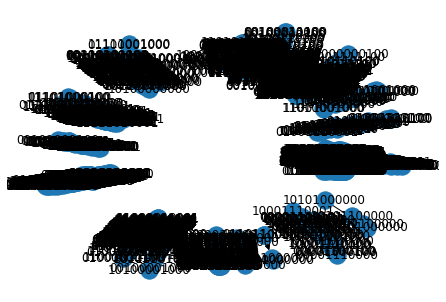

In [31]:
# Edgelist for unperturbed Sync
edgelist = []
for seq in output:
  sequence = seq
  edgelist.append((''.join([str(st) for st in seq[0]]),
                   ''.join([str(st) for st in seq[1]])))
print(edgelist)
G = nx.DiGraph(edgelist)
#print(list(nx.simple_cycles(G)))
nx.draw_spring(G, with_labels=True)
  
#plt.savefig('state_space_network_synchronous_yeast.png')

[('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000000', '00000000000'), ('00000000001', '00000000001'), ('00000000001', '00000000001'), ('00000000001', '00000000001'), ('00000000001', '00000000001'), ('00000000001', '00000000001'), ('00000000001', '00000100001'), ('00000000001', '00000010001'), ('00000000001', '00000000001'), ('00000000001', '00000000001'), ('00000000001', '00000000011'), ('00000000001', '00000000000'), ('00000000010', '00000000010'), ('00000000010', '00000000010'), ('00000000010', '00000000010'), ('00000000010', '00000000010'), ('00000000010', '00000000010'), ('00000000010', '00000000010'), ('00000000010', '00000010010'), ('00000000010', '00000000010'), ('00000000010', '00000000010'), ('00000

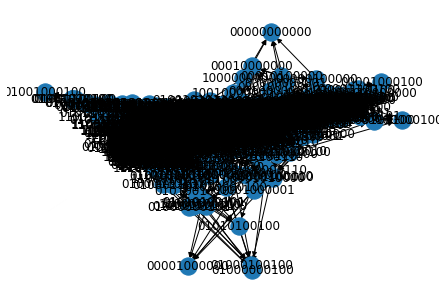

In [30]:
# Edgelist for unperturbed Async
edgelist_a = []
for seq in output_a:
  sequence = seq
  edgelist_a.append((''.join([str(st) for st in seq[0]]),
                   ''.join([str(st) for st in seq[1]])))
print(edgelist_a)
G_a = nx.DiGraph(edgelist_a)
#print(list(nx.simple_cycles(G)))
nx.draw_spring(G_a, with_labels=True)

In [0]:
# Limit Cycle Sync
def find_limit_cycle(G_a):
  limit_cycle = list()
  cycle = list(nx.simple_cycles(G_a))
  return cycle

print(find_limit_cycle(G_a))
#print(len(find_limit_cycle(G)))

[['00000000000'], ['00000000011'], ['00000000100'], ['00000000111'], ['00000001001'], ['00000001011'], ['00000001101'], ['00000001111'], ['00000010000'], ['00000010011'], ['00000010100'], ['00000010111'], ['00000011001'], ['00000011011'], ['00000011101'], ['00000011111'], ['00000100000'], ['00000100011'], ['00000100100'], ['00000100111'], ['00000101001'], ['00000101011'], ['00000101101'], ['00000101111'], ['00000110000'], ['00000110011'], ['00000110100'], ['00000110111'], ['00000111001'], ['00000111011'], ['00000111101'], ['00000111111'], ['00001000000'], ['00001000011'], ['00001000100'], ['00001000111'], ['00001001001'], ['00001001011'], ['00001001101'], ['00001001111'], ['00001010000'], ['00001010011'], ['00001010100'], ['00001010111'], ['00001011001'], ['00001011011'], ['00001011101'], ['00001011111'], ['00001100000'], ['00001100011'], ['00001100100'], ['00001100111'], ['00001101001'], ['00001101011'], ['00001101101'], ['00001101111'], ['00001110000'], ['00001110011'], ['00001110100

In [0]:
# Actual Limit Cycle Sync
def find_longer_list(G_a):
  limit_cycle = find_limit_cycle(G_a)
  long_limit_cycle = []
  for i in limit_cycle:
    if len(i) != 1:
      long_limit_cycle.append(i)
      return long_limit_cycle

print(find_longer_list(G_a))

None


In [0]:
# Self Cycles Sync
def find_self_cycle(G_a):
  self_cycle = []
  G_a = nx.DiGraph(edgelist_a)
  self_loop_edges = list(nx.selfloop_edges(G_a))
  state = [node[0] for node in self_loop_edges]
  return state

print(find_self_cycle(G_a))
print(len(find_self_cycle(G_a)))

['00000000000', '00000000011', '00000000100', '00000000111', '00000001001', '00000001011', '00000001101', '00000001111', '00000010000', '00000010011', '00000010100', '00000010111', '00000011001', '00000011011', '00000011101', '00000011111', '00000100000', '00000100011', '00000100100', '00000100111', '00000101001', '00000101011', '00000101101', '00000101111', '00000110000', '00000110011', '00000110100', '00000110111', '00000111001', '00000111011', '00000111101', '00000111111', '00001000000', '00001000011', '00001000100', '00001000111', '00001001001', '00001001011', '00001001101', '00001001111', '00001010000', '00001010011', '00001010100', '00001010111', '00001011001', '00001011011', '00001011101', '00001011111', '00001100000', '00001100011', '00001100100', '00001100111', '00001101001', '00001101011', '00001101101', '00001101111', '00001110000', '00001110011', '00001110100', '00001110111', '00001111001', '00001111011', '00001111101', '00001111111', '00010000000', '00010000011', '00010000

In [99]:
# Find steady states Sync
def find_steady_states(G_delete):
  steady_states = []
  for node in G_delete.nodes():
    if len(list(G_delete.neighbors(node))) == 0 or len(list(G_delete.neighbors(node))) == 1 and (node in G_delete.neighbors(node)):
      steady_states.append(node)
  return steady_states
print(find_steady_states(G_delete))
print(len(find_steady_states(G_delete)))

['00000000000']
1


In [0]:
# Find steady states Sync Perturbation
def find_steady_states(out_add):
  steady_states = []
  for i in range(len(out_add)):
    print(out_add[i])
    for node in G_add.nodes():
      if len(list(G_add.neighbors(node))) == 0 or len(list(G_add.neighbors(node))) == 1 and (node in G_add.neighbors(node)):
        steady_states.append(node)
    print(steady_states)
    print(len(steady_states))
  #return len(steady_states)
print(find_steady_states(out_add))
#print(len(find_steady_states(out_add)))

[[['MBF'], []], [([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]), ([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]), ([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 0, 0

In [32]:
def has_cell_cycle(G, G_a):
  has_cycle = []
  has_cycle_a = []
  cell_cycle = [('10001000100', '01101000100'), 
                ('01101000100', '01111000100'), 
                ('01111000100', '01110000000'), 
                ('01110000000', '01110001000'), 
                ('01110001000', '01110001011'), 
                ('01110001011', '00010011011'), 
                ('00010011011', '00000110011'), 
                ('00000110011', '00000110111'), 
                ('00000110111', '00000110101'),
                ('00000110101', '00001110100'), 
                ('00001110100', '00001100100'), 
                ('00001100100', '00001000100')]

 # Perturbed - add
#   for i in range(len(out_add)):
#     G_add = out_add[i]
#     #print(nx.has_path(G_add, cell_cycle[0], cell_cycle[11]))
#     if nx.has_path(G_add, cell_cycle[0][0], cell_cycle[11][1]):
#       has_cycle.append(True)
#     else:
#       has_cycle.append(False)
#   return has_cycle

# Unperturbed sync
  for i in cell_cycle:
    #print(i[0])
    if nx.has_path(G, i[0], i[1]):
      has_cycle.append(True)
    else:
      has_cycle.append(False)
  #shortest_path = nx.shortest_path(G, '10001000100', '00001000100')
  #print(len(shortest_path))
  print(has_cycle)
  
# Unperturbed async
  for i in cell_cycle:
    #print(i[0])
    if nx.has_path(G_a, i[0], i[1]):
      has_cycle_a.append(True)
    else:
      has_cycle_a.append(False)
  #shortest_path = nx.shortest_path(G, '10001000100', '00001000100')
  #print(len(shortest_path))
  print(has_cycle_a)  
    
  #shortest_path = nx.shortest_path(G_a, cell_cycle[0][0], cell_cycle[11][0])

print(has_cell_cycle(G, G_a))

[False, False, False, False, False, False, False, False, False, False, False, True]
[True, True, True, True, True, True, True, True, True, True, True, True]
None


In [0]:
# Find basin size unperturbed network
def basin_size(G):
  nodes = G.nodes()
  count = 0
  all_states = all_states = list(map(list, itertools.product([0, 1], repeat = len(proteins))))
  for i in range(len(all_states)):
    all_states[i] = ''.join(str(j) for j in all_states[i])
  for i in range(len(all_states)):
    if nx.has_path(G, all_states[i], '00001000100'):
      count += 1
  return count
  
print(basin_size(G))

1764


In [0]:
# Find basin size perturbed add edges
def basin_size(G_add):
  nodes = G_add.nodes()
  count = 0
  all_states = all_states = list(map(list, itertools.product([0, 1], repeat = len(proteins))))
  for i in range(len(all_states)):
    all_states[i] = ''.join(str(j) for j in all_states[i])
  for i in range(len(all_states)):
    if nx.has_path(G_add, all_states[i], '00001000100'):
      count += 1
  return count
  
print(basin_size(G_add))

1


In [0]:
def create_txt_perturbation(edges_add, G_add):
  file_name = open('yeast_synchronous_perturbed_add.txt', 'w+')
  file_name.write('Action\tBasin_Size\tCell_Cycle_Present\tNumber_of_Steady_States\n')
  
  Action = "{\"Action\": {'spec': {'type1': '%s'},"
  Basin_Size = "\"Basin_Size\": {'spec': {'size': '%s'},"
  Cell_Cyle_Present = "\"Cell_Cycle_Present\": {'spec': {\"presence\": '%s'},"
  Number_of_Steady_States = "\"Number_of_Steady_States\": {'spec': {\"number\": '%s'}}\n"
  
  len_steady_states = find_steady_states(out_add)
  
  for i in range(len(find_new_rule_add))
    for j in range(len(compute_perturbations)):
      type1 = 'add' + 'find_new_rule_add[i]'
      size = 
      presence = 
      for i in range(len(edges_add)):
        if :
      number = steady_states[i]
  
  for i in range(len(find_new_rule_delete)):
    for j in range(len(compute_perturbations)):
      type1 = 'delete' + 'find_new_rule_delete[i]'
      
      
  for i in range(len(find_new_rule_reverse)):
    for j in range(len(compute_perturbations)):
      type1 = 'reverse' + 'find_new_rule_reverse[i]'
      
    
  
  #file_name.write("%s\t%s\t%s\t%s\t" % ())
  file_name.close()
  
print(create_txt_perturbation(edges_add, G_add))

NameError: ignored

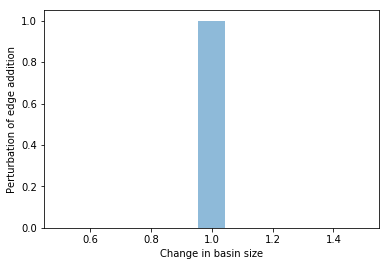

None


In [0]:
import matplotlib.pyplot as plt
def hist_perturb_add(G_add):  #??
  #basin_change = (basin_size(G) - basin_size(G_add)) / (basin_size(G))
  basin_change = (1764 - basin_size(G_add)) / 1764
  num_bins = 11
  plt.hist(basin_change, num_bins, alpha=0.5)
  plt.title('')
  plt.xlabel('Change in basin size')
  plt.ylabel('Perturbation of edge addition')
  plt.show()
  
print(hist_perturb_add(G_add)) #??

In [0]:
# Graphspace Synchronous
def graphspace_synchronous(edgelist_add, G_add):
  nodes = G_add.nodes()
  edges = G_add.edges()
  limit_cycle = find_longer_list(G_add)
  steady_states = find_steady_states(G_add)
  #random_walk = individual_random_walk(nodes)
  #edges_count = count_edges(G)
  #scaled_edges = max_count_edges(G)
  #nodes_count = count_nodes(G)
  #scaled_nodes = max_count_nodes(G)
  
  file_name = open('yeast_synchronous_add.txt', 'w+')
  file_name.write('head\ttail\thead_label\ttail_label\tedge_popup\tstyle\n')

  head = "{\"head\": {'spec': {'shape': '%s','color': '%s','border': \"black\"}, \"id\": '%s'},"
  tail = "\"tail\": {'spec': {'shape': '%s','color': '%s','border': \"black\"}, \"id\": '%s'},"
  edge = "\"edge\": {'spec': {\"target-arrow-shape\": 'triangle', \"color\": '%s'}, \"id\": '%s-%s'}}\n"

  style = head + tail + edge 

  for i in range(0, len(edgelist_add)):
    if limit_cycle != None:
      if edgelist_add[i][0] in limit_cycle:
        edge_color = 'blue'
      else:
        edge_color = 'grey'
    else:
      edge_color = 'grey'
    
    if edgelist_add[i][0] in steady_states:
      shape1 = 'rectangle'
      color1 = 'red'
      edge_color = 'grey'
    else:
      shape1 = 'ellipse'
      color1 = 'grey'
      edge_color = 'grey'
    
    if edgelist_add[i][1] in steady_states:
      shape2 = 'rectangle'
      color2 = 'red'
    else:
      shape2 = 'ellipse'
      color2 = 'grey'   
      
#     if edgelist[i] in scaled_edges.keys():
#       if scaled_edges[edgelist[i]] == 0.0:
#         edge_width = 1.0
#       else:
#         edge_width = scaled_edges[edgelist[i]]
      
#     if edgelist[i][0] in scaled_nodes.keys():
#       if scaled_nodes[edgelist[i][0]] == 0.0:
#         opacity1 = 0.25
#       else:
#         opacity1 = scaled_nodes[edgelist[i][0]]

#     if edgelist[i][1] in scaled_nodes.keys():
#       if scaled_nodes[edgelist[i][1]] == 0.0:
#         opacity2 = 0.25
#       else:
#         opacity2 = scaled_nodes[edgelist[i][1]]
     
      
    file_name.write("%s\t%s\t%s\t%s\t-\t" % (edgelist_add[i][0], edgelist_add[i][1], edgelist_add[i][0], edgelist_add[i][1]))
#     file_name.write(style % (shape1, color1, opacity1, edgelist[i][0], shape2, color2, opacity2, edgelist[i][1], 
#                              edge_color, edge_width, edgelist[i][0], edgelist[i][1]))
    file_name.write(style % (shape1, color1, edgelist_add[i][0], shape2, color2, edgelist_add[i][1],
                              edge_color, edgelist_add[i][0], edgelist_add[i][1]))
    
  file_name.close()   
print(graphspace_synchronous(edgelist_add, G_add))

None


In [0]:
file_name = open('yeast_synchronous_add.txt', 'r+')
print(file_name.read())

head	tail	head_label	tail_label	edge_popup	style
00000000000	00000000000	00000000000	00000000000	-	{"head": {'spec': {'shape': 'rectangle','color': 'red','border': "black"}, "id": '00000000000'},"tail": {'spec': {'shape': 'rectangle','color': 'red','border': "black"}, "id": '00000000000'},"edge": {'spec': {"target-arrow-shape": 'triangle', "color": 'grey'}, "id": '00000000000-00000000000'}}
00000000001	00000000000	00000000001	00000000000	-	{"head": {'spec': {'shape': 'ellipse','color': 'grey','border': "black"}, "id": '00000000001'},"tail": {'spec': {'shape': 'rectangle','color': 'red','border': "black"}, "id": '00000000000'},"edge": {'spec': {"target-arrow-shape": 'triangle', "color": 'grey'}, "id": '00000000001-00000000000'}}
00000000010	00000000000	00000000010	00000000000	-	{"head": {'spec': {'shape': 'ellipse','color': 'grey','border': "black"}, "id": '00000000010'},"tail": {'spec': {'shape': 'rectangle','color': 'red','border': "black"}, "id": '00000000000'},"edge": {'spec': {"tar